In [1]:
import os
import shutil
import h5py
import numpy as np
from astropy.nddata.utils import Cutout2D
from astropy.io import fits
from astropy.table import Table
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)
import tensorflow as tf
from tensorflow import keras
from sklearn.utils import shuffle
import umap
from sklearn.preprocessing import StandardScaler
from astropy.wcs import WCS,utils
%load_ext autoreload
from functions import *
from create_models import *

# Debugging

In [2]:
new_tiles = []
for i in np.array(pd.read_csv('cutouts/broken_tiles.csv').T)[0]:
    if 'r' in list(i) or 'u' in list(i):
        new_tiles.append(i)

In [33]:
for i in list(pd.read_csv('cutouts/broken_tiles.csv'):
     if 'r' in list(i) or 'u' in list(i):
        print(i)

CFIS.229.294.r


In [3]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [3]:
import os
tile_id = '229.294'

tile_name =  'CFIS.' + tile_id + '.r'  + ".fits"
#FILES
#files
# Load the image and the WCS
img_slurm = os.path.abspath(image_dir +'/'+ tile_name )
img_fits = fits.open(img_slurm, memmap=True)[0]
print('opened file')
wcs = WCS(img_fits.header)
                
# Make the cutout, including the WCS
x=8939.309733318474
y=426.1345338456931
cutout = Cutout2D(img_fits.data, position=(x,y), size=cutout_size, wcs=wcs)

# Put the cutout image in the FITS HDU
#img_fits.data = cutout.data

# Update the FITS header with the cutout WCS
#img_fits.header.update(cutout.wcs.to_header())


KeyboardInterrupt: 

In [20]:
cutout.data

array([[-0.1136828 , -1.5328611 ,  1.5599202 , ..., -1.104373  ,
        -0.2764396 ,  0.22035612],
       [ 1.0380814 , -0.08526517, -1.1747105 , ..., -0.8414062 ,
         0.6339384 ,  0.7894791 ],
       [ 0.8837365 ,  1.0885254 , -3.2382526 , ...,  2.5665092 ,
        -0.04748781, -0.83328474],
       ...,
       [ 0.46350265, -1.2037064 , -3.8607664 , ...,  0.70817715,
         1.2650005 ,  2.0398812 ],
       [ 1.5696073 ,  1.487561  , -1.3445785 , ..., -1.5841467 ,
        -2.3700316 , -0.90956813],
       [ 2.5546558 ,  0.7710617 ,  1.8209916 , ...,  1.0795572 ,
        -2.6950293 , -1.6287495 ]], dtype=float32)

# Cutouts with arcs

In [2]:
import csv
with open ('arcs_list.csv', 'r') as f:
    arcs = [row[0] for row in csv.reader(f,delimiter='\t')]


In [3]:
arc_tiles= []

for tile in arcs:
    if '~' not in tile.split(' '):
        arc_tiles.append(tile.split(' ')[0][:-2])

In [4]:
print('tiles with visible arcs:', len(arc_tiles))

tiles with visible arcs: 295


In [5]:
arc_dir = os.path.expandvars("$SCRATCH") + "/" + 'all_cand/'
all_cand = os.listdir(arc_dir)

In [6]:
cand_64 = []
for i in all_cand:
    if 'cutout' in i.split('_'):
        cand_64.append(i)

In [7]:
len(cand_64)

1548

In [8]:
arc_tiles = list(set(list(arc_tiles))) #remove duplicates if any
to_remove = ['254.243', '225.272', '081.185','229.297', '012.180']
[arc_tiles.remove(i) for i in to_remove]
index_dict = {k:v for v,k in enumerate(arc_tiles)}

In [9]:
inv_dict = {v: k for k, v in index_dict.items()}

In [10]:
len(arc_tiles)

289

In [11]:
arcs_array = np.zeros((289,64,64,2))#both u and r channels

i=0
for tile in arc_tiles:

    u_cut = 'CFIS.' + tile + '.u_cutout_0.fits' 
    r_cut = 'CFIS.' + tile + '.r_cutout_0.fits' 
    if u_cut in all_cand:
        img_u = fits.open(arc_dir + u_cut, memmap=True)[0].data    
           
        if img_u.shape == (64,64): #some are cut
            arcs_array[index_dict[tile],...,0] = img_u
        else: 
            continue
            
    if r_cut in all_cand:
        img_r = fits.open(arc_dir + r_cut, memmap=True)[0].data          
            
        if img_r.shape == (64,64): #some are cut
            arcs_array[index_dict[tile],...,1] = img_r
        else: 
            continue
         
    i+=1
print(i == 289-1, '--> should be true')        

True --> should be true


In [14]:
fig, ax = plt.subplots(29*2, 10, figsize=(10*8, 29*2*8))

for i in range(29*2):
    ax[i][0].imshow(arcs_array[5*i,...,0])
    ax[i][1].imshow(arcs_array[5*i,...,1])
    ax[i][2].imshow(arcs_array[5*i+1,...,0])
    ax[i][3].imshow(arcs_array[5*i+1,...,1])
    ax[i][4].imshow(arcs_array[5*i+2,...,0])
    ax[i][5].imshow(arcs_array[5*i+2,...,1])
    ax[i][6].imshow(arcs_array[5*i+3,...,0])
    ax[i][7].imshow(arcs_array[5*i+3,...,1])
    ax[i][8].imshow(arcs_array[5*i+4,...,0])
    ax[i][9].imshow(arcs_array[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+ inv_dict[5*i]  ,size = 50)                
    ax[i][1].set_title('r, '+ inv_dict[5*i]  ,size = 50)
    ax[i][2].set_title('u, '+ inv_dict[5*i+1], size = 50)                
    ax[i][3].set_title('r, '+ inv_dict[5*i+1], size = 50)
    ax[i][4].set_title('u, '+ inv_dict[5*i+2], size = 50)                
    ax[i][5].set_title('r, '+ inv_dict[5*i+2], size = 50)
    ax[i][6].set_title('u, '+ inv_dict[5*i+3], size = 50)                
    ax[i][7].set_title('r, '+ inv_dict[5*i+3], size = 50)
    ax[i][8].set_title('u, '+ inv_dict[5*i+4], size = 50)                
    ax[i][9].set_title('r, '+ inv_dict[5*i+4], size = 50)

IndexError: index 289 is out of bounds for axis 0 with size 289

# Create train, val and test sets

In [12]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"
label_dir = "/home/anahoban/anahoban/GravitationalLensing/Code/Batch Loading/Currently usedlabels/"
label_subdir = "stronglensdb_confirmed_unige/"

In [13]:
cutout_dir = os.path.expandvars("$SCRATCH") + "/"
hf = h5py.File(cutout_dir + "confirmed_cfis_64p.h5", "r")

num_cands = 0
for tile in hf.keys():
    cutouts = list(hf[tile+'/IMAGES'].keys())
    for cut in cutouts:
        if cut[-1] in ['r','u']:
            num_cands += 1

#store all unused tiles in csv file
all_tiles = os.listdir(image_dir)

tiles_for_cuts = []
for name in all_tiles:
    if name.split('.')[0] == 'CFIS' and name.split('.')[1] +'.' + name.split('.')[2] not in arc_tiles:
        tiles_for_cuts.append(name.split('.')[1] + '.' +name.split('.')[2])

hist_tiles = pd.DataFrame(tiles_for_cuts) 

file_tiles_list = './cutouts/list_unused_tiles.csv'
with open(file_tiles_list, mode='a') as f:
    hist_tiles.to_csv(f)

In [14]:
num_cands = 289 #computed from cell above
cutouts_size = 64

#candidate cutouts
conf_cand = np.zeros((num_cands, 64 ,64 , 4)) #just need u and r for now
count = 0
for tile in hf.keys():
    cutouts = list(hf[tile+'/IMAGES'].keys())
    for cut in cutouts:
        if cut[-1] in ['r','u']:
            conf_cand[count,...,:2] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
            if np.isnan(np.sum(conf_cand[count,...,0])): #u is nan
                conf_cand[count,...,0] = np.random.normal(loc = 0.5,scale= 0.13, size=(cutout_size, cutout_size))
            if np.isnan(np.sum(conf_cand[count,...,1])): #r is nan
                conf_cand[count,:,:,1] = np.random.normal(loc = 0.5,scale= 0.13, size=(cutout_size, cutout_size))
            count += 1          
count == num_cands #should be True

In [15]:
import random
#random cutouts
#for now, we want the same number of candidates as non candidates
with open('./cutouts/cutouts_adresses.csv', newline='') as f:
    reader = csv.reader(f)    
    cutout_ids = list(reader)[0]

random.Random(5).shuffle(cutout_ids)

In [16]:
n = 34
num_rand = num_cands*n #number of random cutouts, ratio 1:n
rand_cuts = np.zeros((num_rand, 64 ,64 , 4)) #just need u and r for now
count = 0
for i in cutout_ids:
    tile, cut = i.split(' ')
    if cut[-1] not in ['r','u'] and count < num_rand:
        rand_cuts[count,...,:2 ] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
        count += 1
count == num_rand #should be True

True

In [17]:
arcs_array.shape

(289, 64, 64, 2)

In [18]:
all_arcs = np.concatenate( (arcs_array , np.zeros((289,64,64,2)) ), axis=-1)

In [19]:
#replace zeros with noise
for n, images in enumerate(all_arcs):
    if images[...,0].all() == 0 :
        all_arcs[n,...,0] = np.random.normal(loc = 0.5,scale= 0.13, size=(64,64))
    if images[...,1].all() == 0 :
        all_arcs[n,...,1] = np.random.normal(loc = 0.5,scale= 0.13, size=(64,64))

In [20]:
#create label and full dataset
labels = np.concatenate((np.ones(num_cands),np.zeros(num_rand)))
#cutouts = np.concatenate((conf_cand, rand_cuts))
cutouts = np.concatenate((all_arcs, rand_cuts))

In [21]:
from sklearn.utils import shuffle
X, Y = shuffle(cutouts, labels, random_state=0)

In [22]:
#splitting 70:20:10
train_x, val_x, test_x = np.split(X, [int(.7*len(Y)), int(.9*len(Y))])
train_y, val_y, test_y = np.split(Y, [int(.7*len(Y)), int(.9*len(Y))])

In [23]:
print('checking ratios')
print('test set:', len(test_y[test_y<0.5])/len(test_y[test_y>0.5]))
print('val set:', len(val_y[val_y<0.5])/len(val_y[val_y>0.5]))
print('train set:', len(train_y[train_y<0.5])/len(train_y[train_y>0.5]))


checking ratios
test set: 32.733333333333334
val set: 33.28813559322034
train set: 34.4


In [27]:
#checking in NAN
for cut in range(len(train_x)):
        if np.isnan(np.sum(train_x[cut])) == True:
            print('NAN found in training set, index', cut) 

## Attempt at Color Images

In [24]:
from astropy.visualization import (ZScaleInterval, ImageNormalize)
from astropy.visualization import make_lupton_rgb
from astropy.visualization import simple_norm

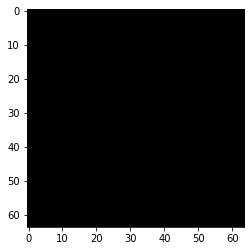

In [32]:
cutout = arcs_array[4]
cutout_r = cutout[:,:,1] #r
cutout_g = np.zeros((64,64))#cutout[:,:,1]
cutout_b = cutout[:,:,0] #u

#norm = simple_norm(cutout_rgb, 'sqrt')
norm_r = ImageNormalize(cutout_r, interval=ZScaleInterval()) #, vmax = 30, vmin =10)
norm_g = ImageNormalize(cutout_g, interval=ZScaleInterval()) #, vmax = 30, vmin =10)
norm_b = ImageNormalize(cutout_b, interval=ZScaleInterval()) #, vmax = 30, vmin =10)


cutout_rgb = make_lupton_rgb(norm_r(cutout_r), cutout_g, norm_b(cutout_b), Q=10, stretch=0.5)

plt.imshow(cutout_rgb)

# plt.imshow(cutout_rgb)

In [ ]:
fig, ax = plt.subplots(29, 10, figsize=(10*8, 29*8))

for i in range(29):
    ax[i][0].imshow(arcs_array[5*i,...,0])
    ax[i][1].imshow(arcs_array[5*i,...,1])
    ax[i][2].imshow(arcs_array[5*i+1,...,0])
    ax[i][3].imshow(arcs_array[5*i+1,...,1])
    ax[i][4].imshow(arcs_array[5*i+2,...,0])
    ax[i][5].imshow(arcs_array[5*i+2,...,1])
    ax[i][6].imshow(arcs_array[5*i+3,...,0])
    ax[i][7].imshow(arcs_array[5*i+3,...,1])
    ax[i][8].imshow(arcs_array[5*i+4,...,0])
    ax[i][9].imshow(arcs_array[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+ inv_dict[5*i]  ,size = 50)                
    ax[i][1].set_title('r, '+ inv_dict[5*i]  ,size = 50)
    ax[i][2].set_title('u, '+ inv_dict[5*i+1], size = 50)                
    ax[i][3].set_title('r, '+ inv_dict[5*i+1], size = 50)
    ax[i][4].set_title('u, '+ inv_dict[5*i+2], size = 50)                
    ax[i][5].set_title('r, '+ inv_dict[5*i+2], size = 50)
    ax[i][6].set_title('u, '+ inv_dict[5*i+3], size = 50)                
    ax[i][7].set_title('r, '+ inv_dict[5*i+3], size = 50)
    ax[i][8].set_title('u, '+ inv_dict[5*i+4], size = 50)                
    ax[i][9].set_title('r, '+ inv_dict[5*i+4], size = 50)

---
# Getting latent space + u-mapping og data and latent space rep


In [24]:
#data for training classifier!!
len_test = len(test_x)

In [25]:
bands = 2
def MSE_with_uncertainty(y_true, y_pred): 
    weights = y_pred[...,bands:] 
    y_pred_image = y_pred[...,:bands]
    
    return K.square(tf.math.multiply((y_true - y_pred_image), weights) )

In [26]:
autoencoder_cfis = keras.models.load_model("../Models/job15.h5", custom_objects={'MSE_with_uncertainty': MSE_with_uncertainty})
encoder = keras.Model(autoencoder_cfis.input, autoencoder_cfis.layers[7].output)

--- 

In [27]:
import sklearn.datasets
import pandas as pd
import numpy as np
import umap.umap_ as umap
import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In [17]:
#sns.set_theme(context='poster', rc={'figure.figsize':(7,5)}, palette = sns.color_palette())

#### on cutouts

In [29]:
#2d
reducer = umap.UMAP(random_state=42)
mapper =reducer.fit(test_x.reshape(len_test,64*64*4))
embedding = reducer.transform(test_x.reshape(len_test,64*64*4))

data = test_x.reshape(len_test,64*64*4)

In [33]:
data_list = test_y
def draw_umap(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data_list)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data_list)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data_list, s=100)
    plt.title(title, fontsize=18)

In [ ]:
plt.scatter(embedding[:,0], embedding[:,1], c=test_y)

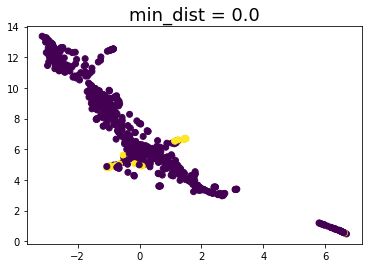

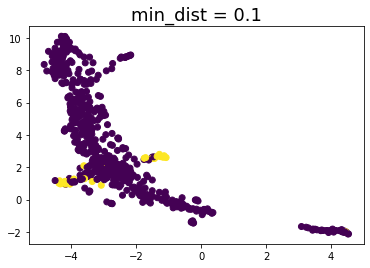

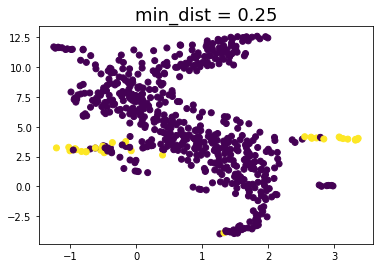

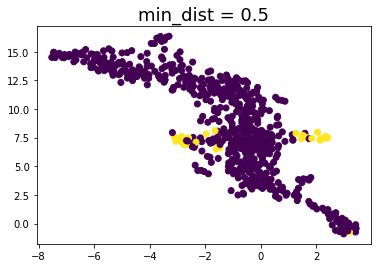

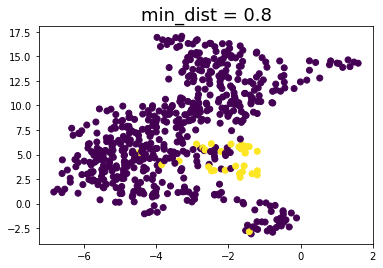

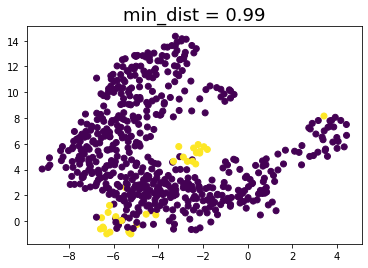

In [32]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(data, min_dist=d, title='min_dist = {}'.format(d))

/home/anahoban/lensing/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


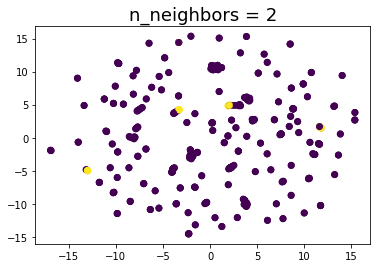

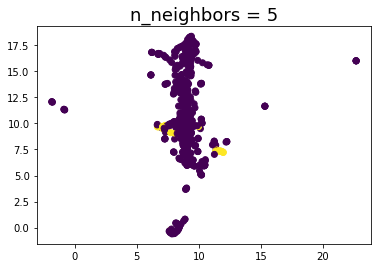

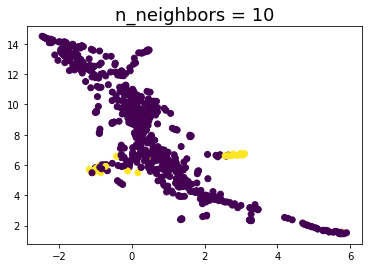

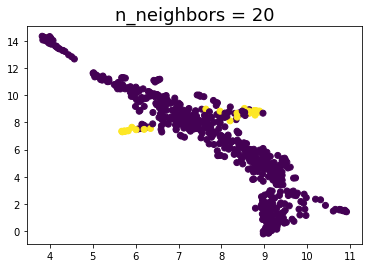

In [33]:
for n in (2, 5, 10, 20):
    draw_umap(data, n_neighbors=n, title='n_neighbors = {}'.format(n))

---
## on latent space

In [34]:
latent_x = encoder.predict(test_x)
len_test= len(latent_x)
data = latent_x.reshape(len_test,64*64*32)

In [29]:
#2d
reducer = umap.UMAP(random_state=42)
mapper =reducer.fit(latent_x.reshape(len_test,64*64*32))
embedding = reducer.transform(latent_x.reshape(len_test,64*64*32))

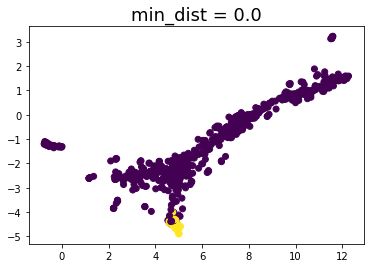

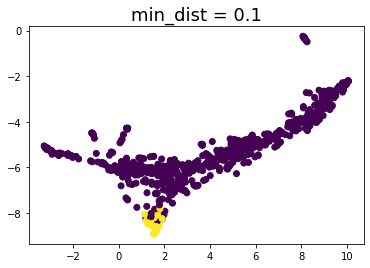

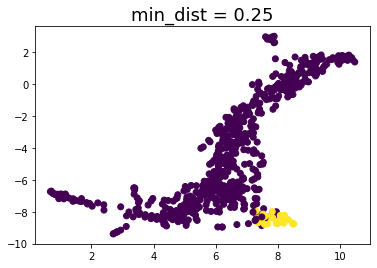

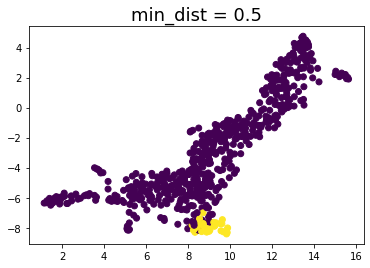

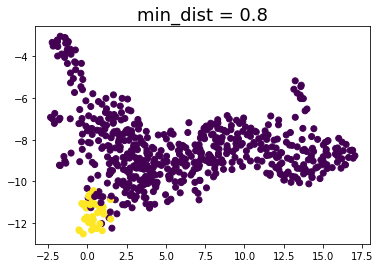

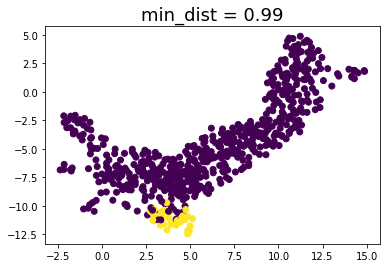

In [33]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(data, min_dist=d, title='min_dist = {}'.format(d))

/home/anahoban/lensing/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


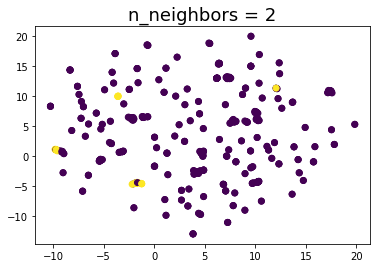

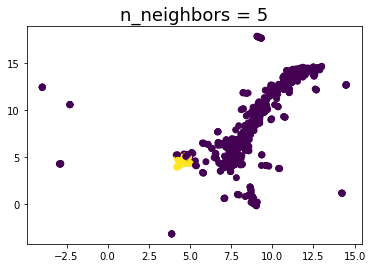

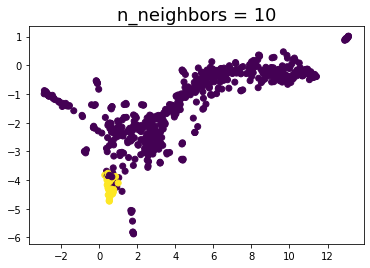

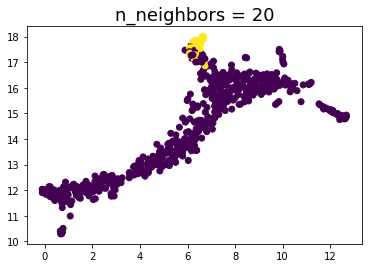

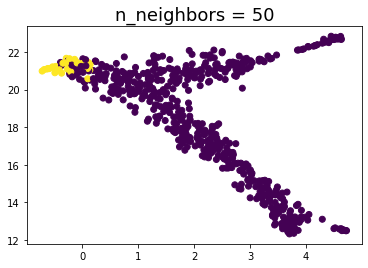

In [32]:
data_list = test_y
for n in (2, 5, 10, 20, 50):
    draw_umap(data, n_neighbors=n, title='n_neighbors = {}'.format(n))

In [38]:
%matplotlib widget
draw_umap(data, n_neighbors=5, n_components=3, title='n_components = 3')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

--- 
# Data Augmentation

In [28]:
import random
def rotation(array):
    rand = random.random()
    if rand < 1/3:
        return np.rot90(array, k=1, axes=(0,1))
    elif rand > 2/3:
        return np.rot90(array, k=2, axes=(0,1))
    else:
        return array
    

In [29]:
ex = rotation(train_x[0,...])

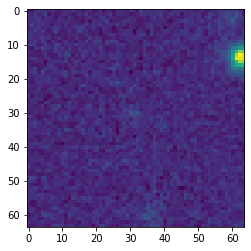

In [30]:
%matplotlib inline
plt.imshow(ex[...,1])

In [31]:
#create data generator
datagen = keras.preprocessing.image.ImageDataGenerator(
            width_shift_range=5,
            height_shift_range=5,
            #zoom_range=0.2,
            horizontal_flip=True,
            vertical_flip = True,
            preprocessing_function = rotation
            )
#create iterator (in train_classifier fct)
it = datagen.flow(train_x,batch_size=1)

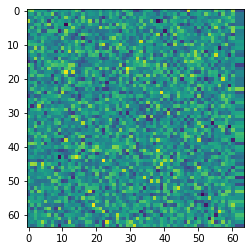

In [32]:
plt.imshow(it.next()[0,...,1])

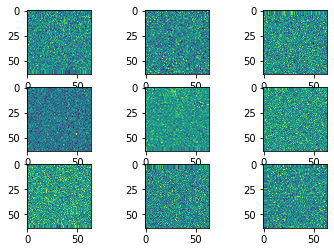

In [33]:
# generate samples and plot
for i in range(9):
	# define subplot
	plt.subplot(330 + 1 + i)
	# generate batch of images
	batch = it.next()
	# plot raw pixel data
	plt.imshow(batch[0,...,0])
# show the figure
plt.show()


---

# Create and train classifier

In [34]:
def train_classifier(model, train_x, train_y, val_x, val_y, n_epochs, batch_size):
    train_steps = len(train_y) // batch_size
    val_steps = len(val_y) // batch_size
#     history = model.fit(iterator, 
#                         epochs=n_epochs,
#                         validation_data = (val_x, val_y), 
#                         callbacks=[callback])#, class_weight=class_weight)
    
    # fits the model on batches with real-time data augmentation:
    history = model.fit(
             datagen.flow(train_x, train_y, batch_size=batch_size),
             validation_data=datagen.flow(val_x, val_y,
             batch_size=batch_size),
             steps_per_epoch=train_steps,
             epochs=n_epochs,
             callbacks=[callback]
             )
    
    return model, history


def custom_loss_all(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_all), y_pred*np.sqrt(weights_all))

In [35]:
for i in range(len(encoder.layers)):
    encoder.layers[i].trainable = False

In [36]:
def scheduler(epoch, lr):
    if epoch < 20:
        return lr
    else:
        return lr*tf.math.exp(-0.5)
    
def step_decay(epoch, lr):
    drop = 0.5
    epochs_drop = 20.0
    lr = lr * tf.math.pow(drop,  
           tf.math.floor((1+epoch)/epochs_drop))
    return lr

In [38]:
#classifier = keras.models.load_model("../Models/binary_classifier")

In [39]:
#classifier.summary()

In [40]:
#keras.utils.plot_model(classifier, to_file="../Models/binary_classifier.png", show_shapes=True, show_layer_names=True)

In [37]:
#uneven set
initial_bias = np.log10([num_rand/num_cands])

In [38]:
%autoreload
cutout_size = 64
#uneven set
classifier = create_classifier(encoder, initial_bias)
#classifier = create_classifier(encoder)
optimizer = keras.optimizers.Adam(learning_rate=1e-5)
callback = keras.callbacks.LearningRateScheduler(step_decay)
#callback = keras.callbacks.LearningRateScheduler(scheduler)
classifier.compile(optimizer=optimizer, loss="binary_crossentropy", metrics="accuracy")

In [39]:
N_EPOCHS = 40
BATCH_SIZE = 256
(classifier, history) = train_classifier(classifier, train_x, train_y, val_x, val_y, n_epochs = N_EPOCHS, batch_size = BATCH_SIZE)
#classifier.save("../Models/binary_classifier_alt")
hist_df = pd.DataFrame(history.history) 

hist_csv_file = '../Histories/history_binary_classifier.csv'
with open(hist_csv_file, mode='a') as f:
    hist_df.to_csv(f)

Epoch 1/40
27/27 [==============================] - 18s 673ms/step - loss: 0.2694 - accuracy: 0.8858 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 2/40
27/27 [==============================] - 13s 490ms/step - loss: 6.5637e-04 - accuracy: 1.0000 - val_loss: 4.2071e-04 - val_accuracy: 1.0000
Epoch 3/40
27/27 [==============================] - 12s 453ms/step - loss: 3.8793e-04 - accuracy: 1.0000 - val_loss: 3.4425e-04 - val_accuracy: 1.0000
Epoch 4/40
27/27 [==============================] - 13s 481ms/step - loss: 0.0229 - accuracy: 0.9999 - val_loss: 5.2665e-04 - val_accuracy: 1.0000
Epoch 5/40
27/27 [==============================] - 13s 465ms/step - loss: 0.0033 - accuracy: 0.9994 - val_loss: 0.0035 - val_accuracy: 0.9985
Epoch 6/40
27/27 [==============================] - 12s 449ms/step - loss: 0.0013 - accuracy: 0.9997 - val_loss: 6.4512e-04 - val_accuracy: 1.0000
Epoch 7/40
27/27 [==============================] - 14s 528ms/step - loss: 0.0010 - accuracy: 0.9997 - val_loss: 4.717

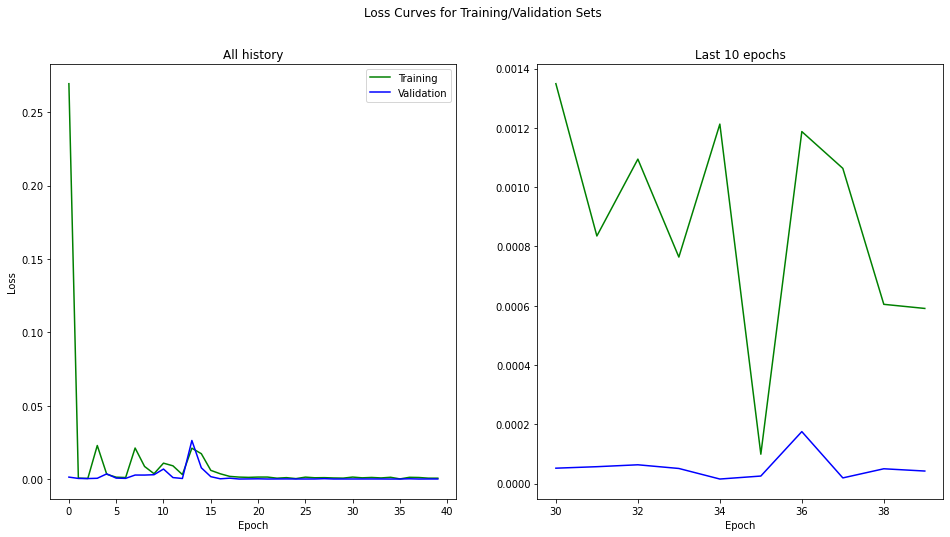

In [40]:
%autoreload
plot_loss_curves(hist_df, 10, figname="binary_classifier.png")

Text(0.5, 1.0, 'accuracy')

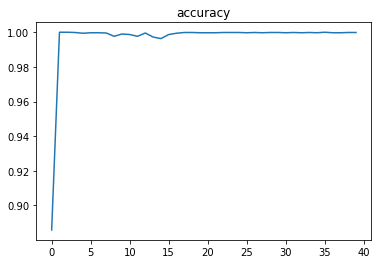

In [42]:
plt.plot(hist_df['accuracy'])
plt.title('accuracy')

In [48]:
#classifier.save("../Models/classifier_from_job15")

---
## Testing

In [63]:
non_lens = train_x[train_y< 0.5]
lens = train_x[train_y > 0.5]

#visualizing LENSES in the test set
fig, ax = plt.subplots(33, 16, figsize=(16*8, 33*8))

for i in range(33):
    ax[i][0].imshow(lens[8*i,...,0])
    ax[i][1].imshow(lens[8*i,...,1])
    ax[i][2].imshow(lens[8*i+1,...,0])
    ax[i][3].imshow(lens[8*i+1,...,1])
    ax[i][4].imshow(lens[8*i+2,...,0])
    ax[i][5].imshow(lens[8*i+2,...,1])
    ax[i][6].imshow(lens[8*i+3,...,0])
    ax[i][7].imshow(lens[8*i+3,...,1])
    ax[i][8].imshow(lens[8*i+4,...,0])
    ax[i][9].imshow(lens[8*i+4,...,1])
    ax[i][10].imshow(lens[8*i+5,...,0])
    ax[i][11].imshow(lens[8*i+5,...,1])
    if 8*i+6 < 262:
        ax[i][12].imshow(lens[8*i+6,...,0])
        ax[i][13].imshow(lens[8*i+6,...,1])
        ax[i][14].imshow(lens[8*i+7,...,0])
        ax[i][15].imshow(lens[8*i+7,...,1])
    
    if i == 0:
        ax[i][0].set_title('u', size = 50)                
        ax[i][1].set_title('r', size = 50)
        ax[i][2].set_title('u', size = 50)                
        ax[i][3].set_title('r', size = 50)
        ax[i][4].set_title('u', size = 50)                
        ax[i][5].set_title('r', size = 50)
        ax[i][6].set_title('u', size = 50)                
        ax[i][7].set_title('r', size = 50)
        ax[i][8].set_title('u', size = 50)                
        ax[i][9].set_title('r', size = 50)
        ax[i][10].set_title('u', size = 50)                
        ax[i][11].set_title('r', size = 50)
        ax[i][12].set_title('u', size = 50)                
        ax[i][13].set_title('r', size = 50)
        ax[i][14].set_title('u', size = 50)                
        ax[i][15].set_title('r', size = 50)  
plt.savefig('../Plots/Train_lens_all')

#visualizing test set
fig, ax = plt.subplots(7*2, 6, figsize=(60,140))

for i in range(7*2):
    ax[i][0].imshow(non_lens[3*i,...,0])
    ax[i][1].imshow(non_lens[3*i,...,1])
    ax[i][2].imshow(non_lens[3*i+1,...,0])
    ax[i][3].imshow(non_lens[3*i+1,...,1])
    ax[i][4].imshow(non_lens[3*i+2,...,0])
    ax[i][5].imshow(non_lens[3*i+2,...,1])
    if i == 0:
        ax[i][0].set_title('u', size = 50)                
        ax[i][1].set_title('r', size = 50)
        ax[i][2].set_title('u', size = 50)                
        ax[i][3].set_title('r', size = 50)
        ax[i][4].set_title('u', size = 50)                
        ax[i][5].set_title('r', size = 50)
    
plt.savefig('../Plots/Train_nonlens_notall')

(array([982.,  30.]),
 array([0. , 0.5, 1. ]),
 <BarContainer object of 2 artists>)

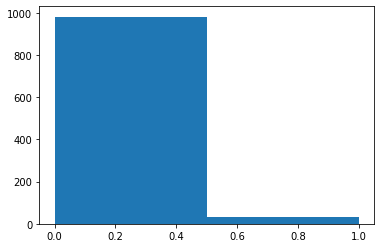

In [43]:
plt.hist(test_y, bins = 2)

In [72]:
def evaluate_model(model, x_test, y_test):
    test_loss, test_acc = model.evaluate(x_test, y_test)
    y_predict = model.predict(x_test)
    plt.hist(y_predict)
    print("Lowest 10 scores:")
    print(sorted(y_predict)[:10])
    print()
    print("Highest 10 scores:")
    print()
    print(sorted(y_predict)[-10:])
    conf = tf.math.confusion_matrix(y_test, y_predict)
    print(f"Confusion Matrix:\n {conf}")
    print("Test loss: %.3f" % test_loss)
    print("Test accuracy: %3f" % test_acc)
    
    for i in range(len(y_predict)):
        if np.round(y_predict[i]) != y_test[i]:
            if y_test[i] == 0:
                f, ax = plt.subplots(1, 2, figsize=(4,2))
                ax[0].imshow(x_test[i,...,0])
                ax[1].imshow(x_test[i,...,1])
                plt.suptitle('FALSE POSITIVE, pred = '+ '%.3f'%(y_predict[i]))
                plt.savefig(f'../Class/test_fp{i}')
            if y_test[i] == 1:
                f, ax = plt.subplots(1, 2, figsize=(4,2))
                ax[0].imshow(x_test[i,...,0])
                ax[1].imshow(x_test[i,...,1])
                plt.suptitle('FALSE NEGATIVE, pred =' + '%.3f'%(y_predict[i]))
                plt.savefig(f'../Class/test_fn{i}')
    return y_predict

32/32 [==============================] - 0s 4ms/step - loss: 0.0142 - accuracy: 0.9990
Lowest 10 scores:
[array([1.0732317e-16], dtype=float32), array([9.945034e-15], dtype=float32), array([1.144352e-14], dtype=float32), array([1.3760017e-14], dtype=float32), array([2.3694778e-14], dtype=float32), array([4.829338e-14], dtype=float32), array([5.1267818e-14], dtype=float32), array([5.225785e-14], dtype=float32), array([6.5173534e-14], dtype=float32), array([7.986843e-14], dtype=float32)]

Highest 10 scores:

[array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32), array([1.], dtype=float32)]
Confusion Matrix:
 [[982   0]
 [  1  29]]
Test loss: 0.014
Test accuracy: 0.999012


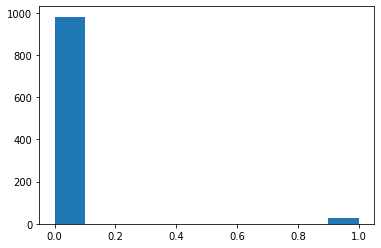

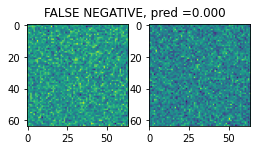

In [73]:
pred_label = evaluate_model(classifier, test_x, test_y)

---- 
# ROC curve
Smaller values on the x-axis of the plot indicate lower false positives and higher true negatives.
Larger values on the y-axis of the plot indicate higher true positives and lower false negatives.

In [56]:
from sklearn import metrics

In [58]:
fpr, tpr, thresholds = metrics.roc_curve(y_true = test_y, y_score = pred_label)
# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(test_y))]

In [59]:
ns_auc = metrics.roc_auc_score(test_y, ns_probs)
lr_auc = metrics.roc_auc_score(test_y, pred_label)

No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.981


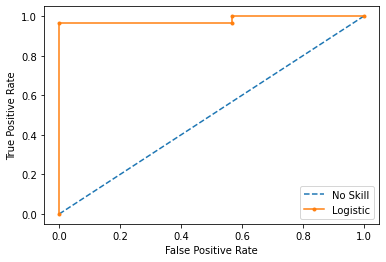

In [60]:
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = metrics.roc_curve(test_y, ns_probs)
lr_fpr, lr_tpr, _ = metrics.roc_curve(test_y, pred_label)
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()

# Precision-Recall curve

Instructions for updating:
Please use `model.predict()` instead.
Logistic: f1=0.058 auc=0.968


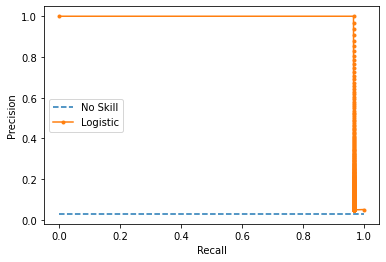

In [61]:
# precision-recall curve and f1 for an imbalanced dataset
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
# predict probabilities
lr_probs = classifier.predict_proba(test_x)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 0]
# predict class values
yhat = classifier.predict(test_x)
yhat[yhat<0.5] = 0
yhat[yhat<1] = 1
# calculate precision and recall for each threshold
lr_precision, lr_recall, _ = precision_recall_curve(test_y, lr_probs)
# calculate scores
lr_f1, lr_auc = f1_score(test_y, yhat), auc(lr_recall, lr_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
# plot the precision-recall curves
no_skill = len(test_y[test_y==1]) / len(test_y)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(lr_recall, lr_precision, marker='.', label='Logistic')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

hf_pos.close()
hf_neg.close()

---
# Classifying new cutouts

In [62]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"
scratch = "/home/anahoban/scratch/"

In [63]:
ls

 Classifier2.0.ipynb                __pycache__/       job_outputs/
'Lens Binary Classifier.ipynb'      arcs_list.csv      job_scripts/
'Multi-Channel Autoencoder.ipynb'   classes.py         labels/
 New_fcts.ipynb                     create_models.py   mastercat/
 Tests.ipynb                        cutouts/           norm_tests.ipynb
 Twobands_tests.ipynb               func_job2.py       wandb/
 Untitled.ipynb                     functions.py


In [64]:
hf = h5py.File(cutout_dir + "cutouts_filtered_64p.h5", "r")
#hf = h5py.File(cutout_dir + "random_cutouts_cfis.h5", "r")

In [66]:
hf['cutout0']

<HDF5 dataset "cutout0": shape (64, 64, 5), type "<f8">

In [52]:
#rnadom cutouts
n = 288
new_cutouts = np.zeros((n, 64 ,64 , 4)) #just need u and r for now
count = 0
tiles_list = list(hf.keys())
tile = tiles_list[0]
print(tile)
cutouts = list(hf.keys())
for cut in cutouts:
        new_cutouts[count,...,:2] = np.array(hf[cut])[...,[0,2]]
        count += 1          
count == n #should be True

cutout0


True

In [65]:
#cutouts filtered
n = 5000
new_cutouts = np.zeros((n, 64 ,64 , 4)) #just need u and r for now
count = 0
tiles_list = list(hf.keys())
tile = tiles_list[0]
print(tile)
cutouts = list(hf[tile+'/IMAGES'].keys())
for cut in cutouts:
        new_cutouts[count,...,:2] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
        count += 1          
count == n #should be True

180.272


False

In [66]:
new_cutouts.shape

(5000, 64, 64, 4)

In [67]:
y_predict = classifier.predict(new_cutouts)

(array([4.998e+03, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([2.5726030e-14, 3.2286033e-02, 6.4572066e-02, 9.6858099e-02,
        1.2914413e-01, 1.6143017e-01, 1.9371620e-01, 2.2600223e-01,
        2.5828826e-01, 2.9057431e-01, 3.2286033e-01], dtype=float32),
 <BarContainer object of 10 artists>)

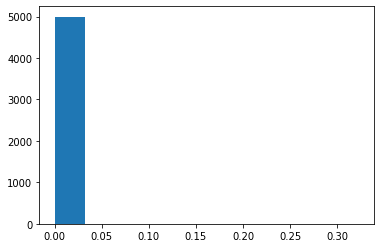

In [68]:
plt.hist(y_predict)

In [69]:
pred_lens = new_cutouts[y_predict[...,0] > 0.5]
preds = y_predict[y_predict[...,0] > 0.5]
#random.Random(5).shuffle(pred_lens)
#random.Random(5).shuffle(preds)
selection = pred_lens[:100]
preds_selection = preds[:100]

IndexError: index 0 is out of bounds for axis 0 with size 0

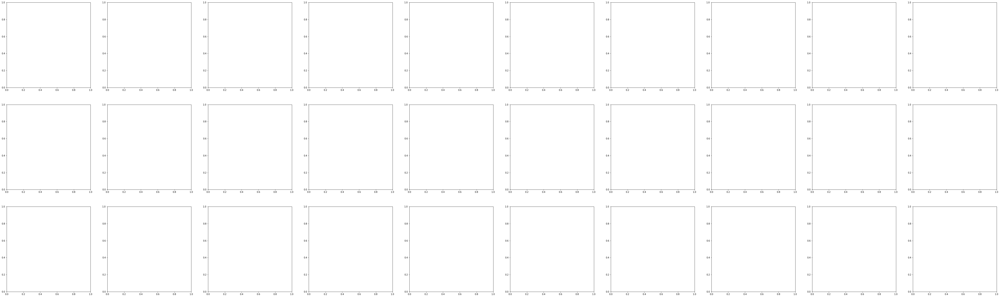

In [70]:
#visualizing LENSES in the test set
rows = 3
fig, ax = plt.subplots(rows, 10, figsize=(10*8, rows*8))

for i in range(rows):
    ax[i][0].imshow(selection[5*i,...,0])
    ax[i][1].imshow(selection[5*i,...,1])
    ax[i][2].imshow(selection[5*i+1,...,0])
    ax[i][3].imshow(selection[5*i+1,...,1])
    ax[i][4].imshow(selection[5*i+2,...,0])
    ax[i][5].imshow(selection[5*i+2,...,1])
    ax[i][6].imshow(selection[5*i+3,...,0])
    ax[i][7].imshow(selection[5*i+3,...,1])
    ax[i][8].imshow(selection[5*i+4,...,0])
    ax[i][9].imshow(selection[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+'%.3f'%(preds_selection[5*i]), size = 50)                
    ax[i][1].set_title('r, '+'%.3f'%(preds_selection[5*i]), size = 50)
    ax[i][2].set_title('u, '+'%.3f'%(preds_selection[5*i+1]), size = 50)                
    ax[i][3].set_title('r, '+'%.3f'%(preds_selection[5*i+1]), size = 50)
    ax[i][4].set_title('u, '+'%.3f'%(preds_selection[5*i+2]), size = 50)                
    ax[i][5].set_title('r, '+'%.3f'%(preds_selection[5*i+2]), size = 50)
    ax[i][6].set_title('u, '+'%.3f'%(preds_selection[5*i+3]), size = 50)                
    ax[i][7].set_title('r, '+'%.3f'%(preds_selection[5*i+3]), size = 50)
    ax[i][8].set_title('u, '+'%.3f'%(preds_selection[5*i+4]), size = 50)                
    ax[i][9].set_title('r, '+'%.3f'%(preds_selection[5*i+4]), size = 50)
#plt.savefig('../Plots/new_found_lens')    

In [78]:
hf.close()